## 1 - DATA

### 1.1 - IMPORTS

In [1]:
# BIBLIOTECAS BASES
import pandas as pd
import numpy as np
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

# AUXILIARES
import utils
import decorators
import plots

# RETIRAR AVISOS
from warnings import filterwarnings; filterwarnings('ignore')

# RESIZE PADRÃO PLOTS
from matplotlib.pylab import rcParams; rcParams['figure.figsize'] = 15,10

# ATUALIZAR BIBLIOTECAS
import importlib
importlib.reload(plots)
importlib.reload(utils)
importlib.reload(decorators)

<module 'decorators' from 'c:\\Users\\leore\\Downloads\\Dados\\Analise Exploratoria\\decorators.py'>

### 1.2 - IMPORT DATAFRAME: PERIOD 2019 - 2023


In [2]:
df = utils.df_import(year_range=(2019,2023))

### 1.3 - IDENTIFICAR DADOS QUE PRECISAM DE TRATAMENTO

#### 1.3.1 - DESCREVER DADOS E FORMATOS

In [3]:
utils.df_describe(df)

VALORES NULOS
DataHora           0
Satelite           0
Pais               0
Estado             0
Municipio          0
Bioma              0
DiaSemChuva     9461
Precipitacao    9461
RiscoFogo       9461
Latitude           0
Longitude          0
FRP             2633
dtype: int64

DTYPES
DataHora         object
Satelite         object
Pais             object
Estado           object
Municipio        object
Bioma            object
DiaSemChuva     float64
Precipitacao    float64
RiscoFogo       float64
Latitude        float64
Longitude       float64
FRP             float64
dtype: object

SHAPE
(805273, 12)
DESCRIBE


,DiaSemChuva,Precipitacao,RiscoFogo,Latitude,Longitude,FRP
count,795812.000000,795812.000000,795812.000000,805273.000000,805273.000000,802640.000000
mean,12.510859,0.767364,-4.817083,-10.597104,-52.542067,64.263996
std,109.194364,3.359622,74.122008,6.260014,7.974855,143.814919
min,-999.000000,0.000000,-999.000000,-33.740460,-73.673660,0.000000
25%,3.000000,0.000000,0.400000,-14.135000,-57.539500,15.400000
50%,8.000000,0.000000,0.900000,-9.436460,-51.704440,28.900000
75%,27.000000,0.000000,1.000000,-6.488540,-46.129000,60.900000
max,827.000000,143.000000,1.000000,5.152560,-34.816000,9612.200000


#### 1.3.2 - PLOT INICIAL PARA VERIFICAR DADOS

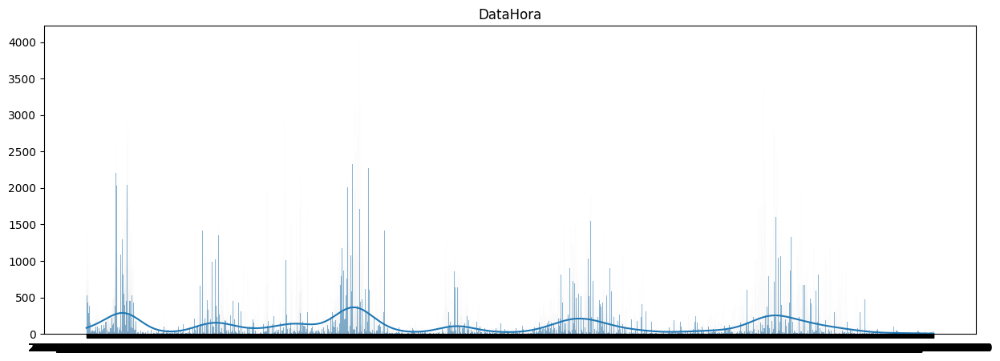

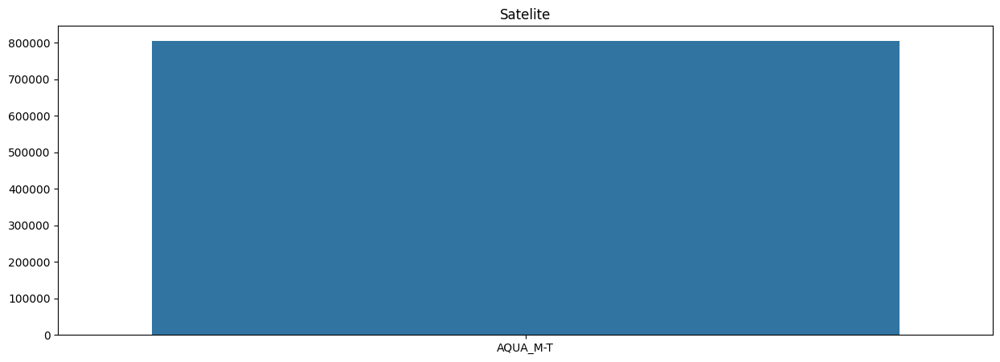

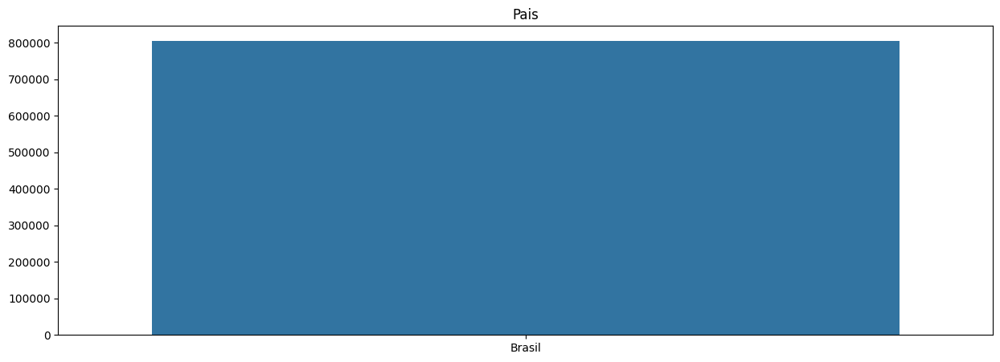

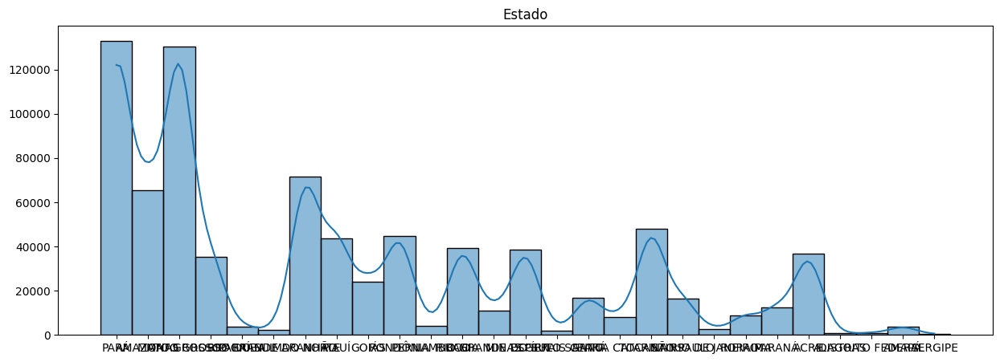

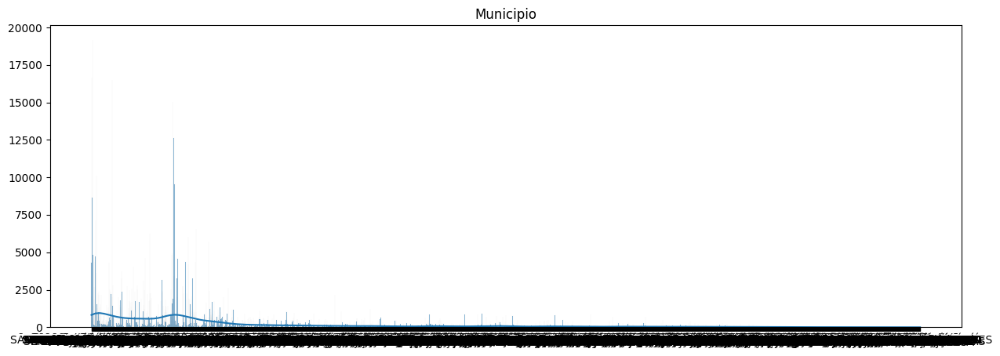

...

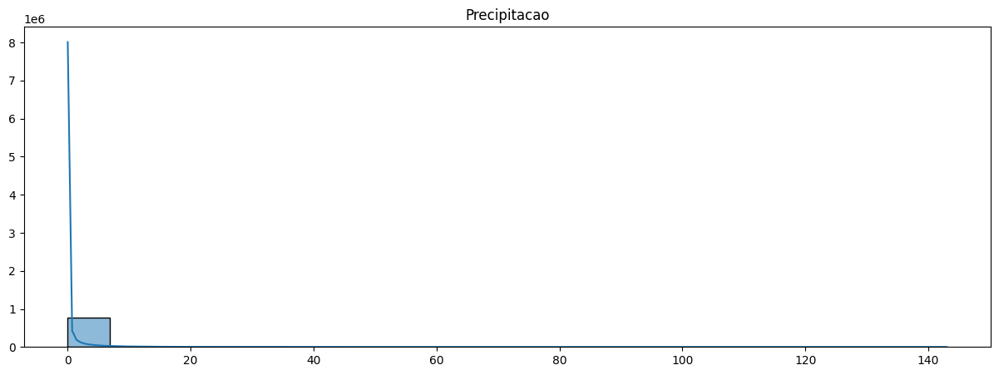

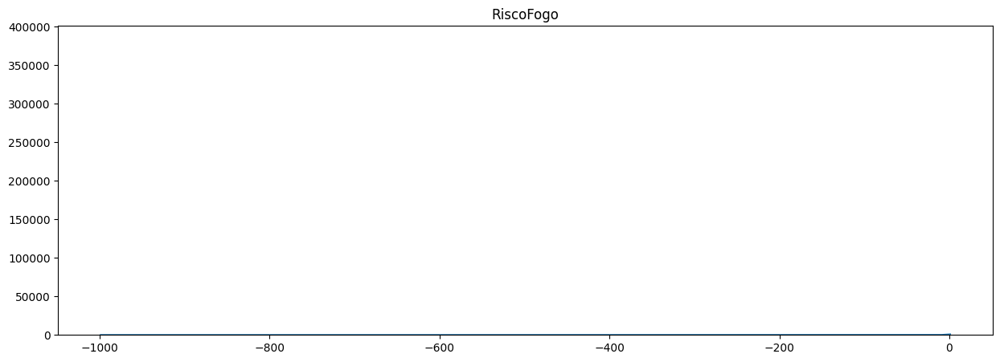

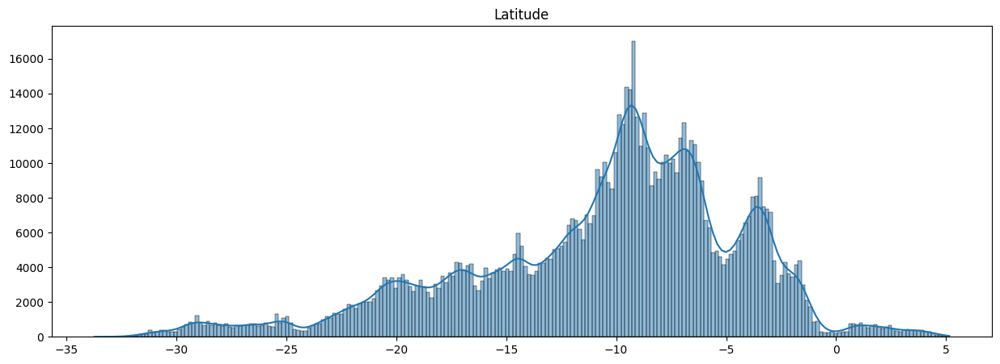

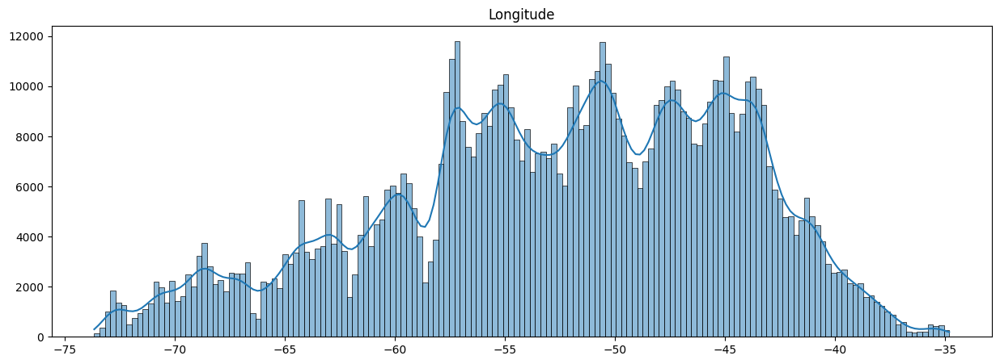

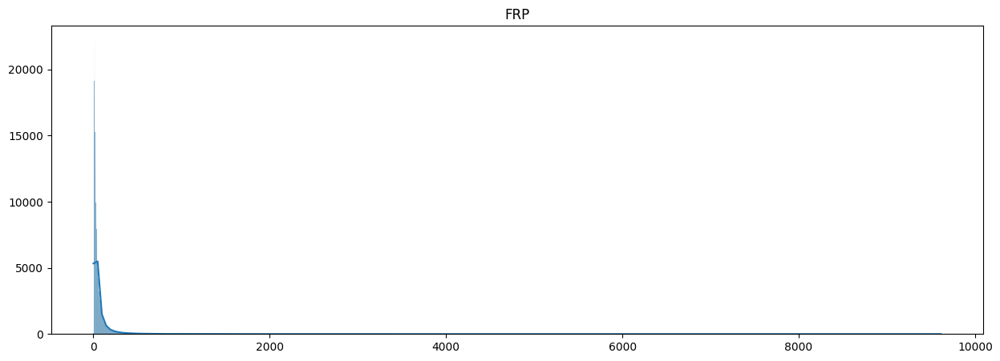

In [4]:
plots.plot_inicial(df)

### 1.4 - TRATAMENTO DE DADOS
- CONVERTER DATAHORA PARA FORMATO DATETIME;
- CRIAR COLUNA DE DATA;
- REMOVER COLUNAS CONSTANTES (NÃO VARIAM ENTRE LINHAS);
- REMOVER DATAHORA;
- RETIRAR PROBABILIDADE DE FOGO -999;
- RETIRAR DIAS SEM CHUVA -999;
- REMOVER NULOS;
- EXTRAÇÃO INFOS DATA.


In [5]:
# CONVERTER DATAHORA PARA DATETIME
df['DataHora'] = pd.to_datetime(df['DataHora'], format='%Y/%m/%d %H:%M:%S', errors='coerce')

# CRIAR COLUNA DE DATA
df['Data'] = df['DataHora'].apply(lambda x: x.date())

# COLUNAS CONSTANTES
df.drop(['Satelite', 'Pais', 'DataHora'], axis=1, inplace=True)

# RETIRAR PROBABILIDADE DE FOGO -999 // RETIRAR DIAS SEM CHUVA -999 // DROP NULOS
df = df\
        .loc[(df['RiscoFogo'] >= 0) & (df['RiscoFogo'] <= 1)]\
        .loc[df['DiaSemChuva'] >= 0]\
        .dropna()\
        .copy()\
        .reset_index(drop=True)

# SPLIT DATE
df['dia']    = df['Data'].apply(lambda x: x.day)
df['mes']    = df['Data'].apply(lambda x: x.month)
df['ano']    = df['Data'].apply(lambda x: x.year)
df['semana'] = df['Data'].apply(lambda x: x.isocalendar()[1])

### 1.5 - OUTLIERS

#### 1.5.1 DBSCAN

In [6]:
df = df\
    .groupby(['Estado', 'Municipio', 'Bioma', 'Data', 'dia', 'mes', 'ano', 'semana'], as_index=False)\
    .agg({'DiaSemChuva' :'mean'
         ,'Precipitacao':'mean'
         ,'RiscoFogo'   :'mean'
         ,'Latitude'    :'mean'
         ,'Longitude'   :'mean'
         ,'FRP'         :'mean'})

df = utils.outliers_dbscan(df=df, eps=.5, min_samples=30)

#### 1.5.2 PORCENTAGEM AFETADA

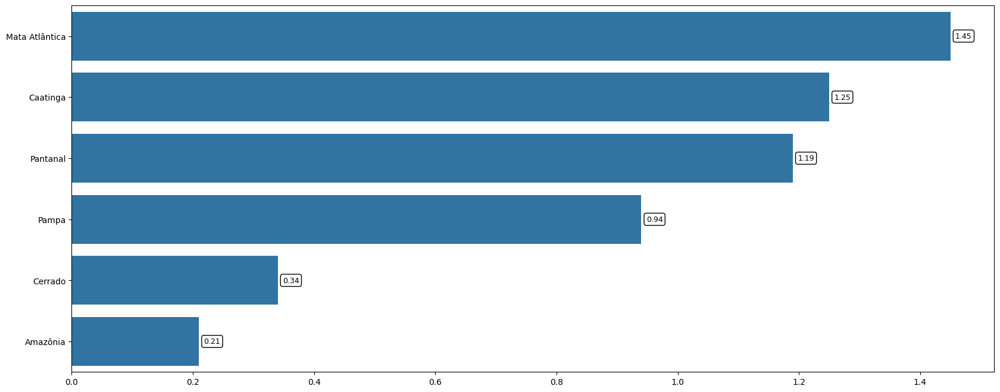

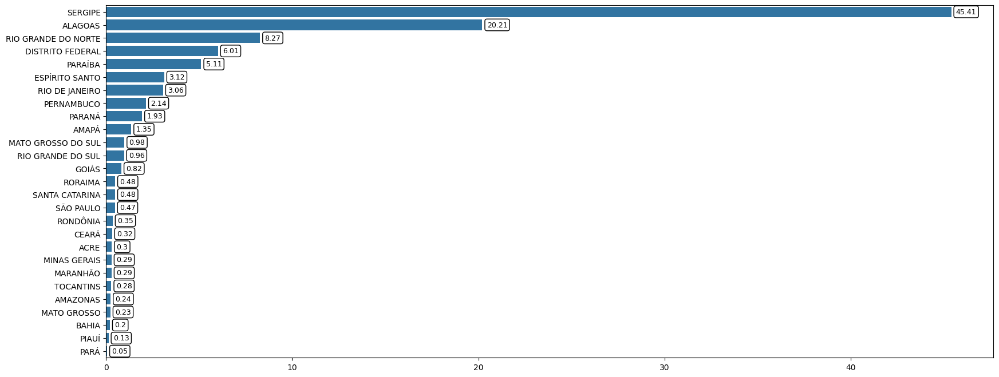

In [7]:
plots.perc_outliers(df, 'Bioma')
plots.perc_outliers(df, 'Estado')

#### 1.5.3 IDENTIFICANDO OUTLIERS

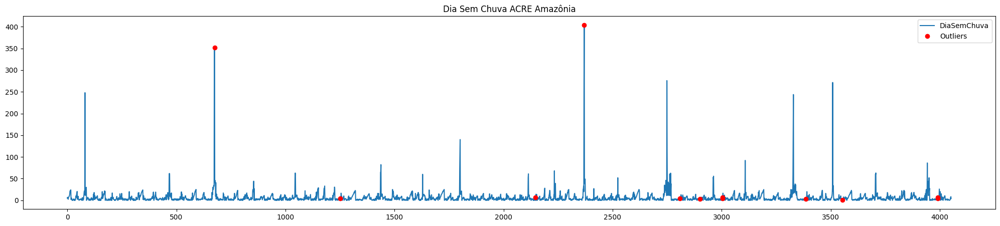

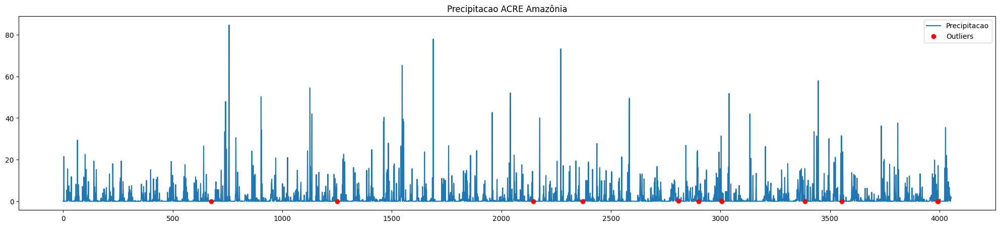

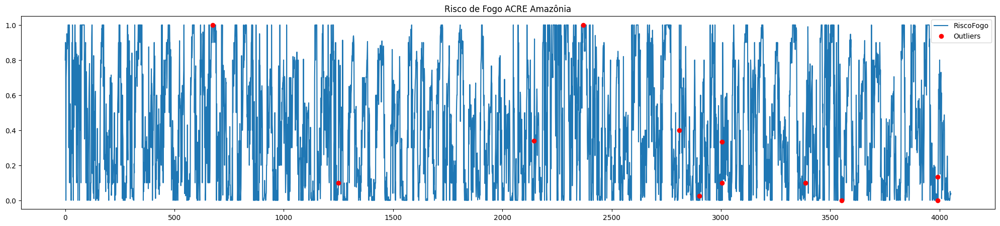

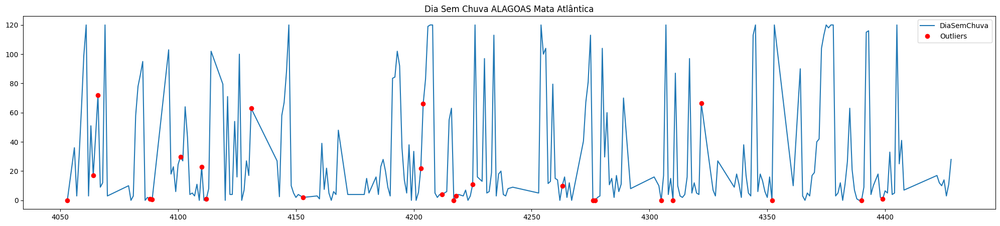

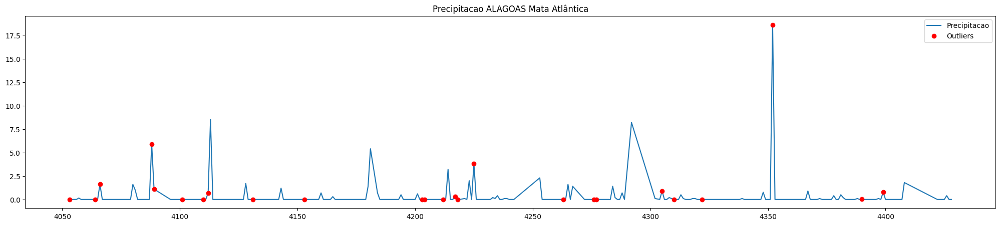

...

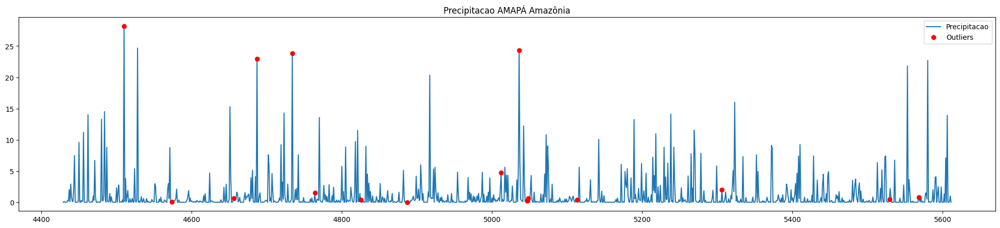

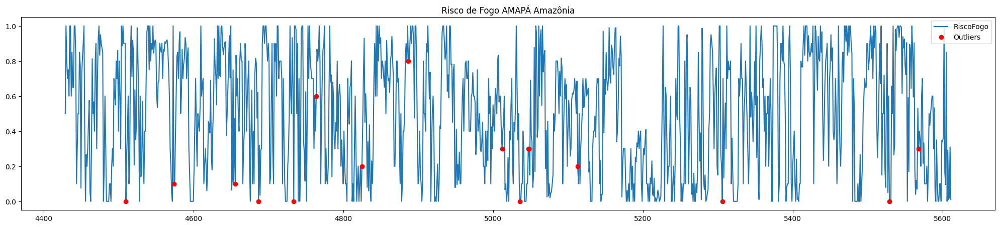

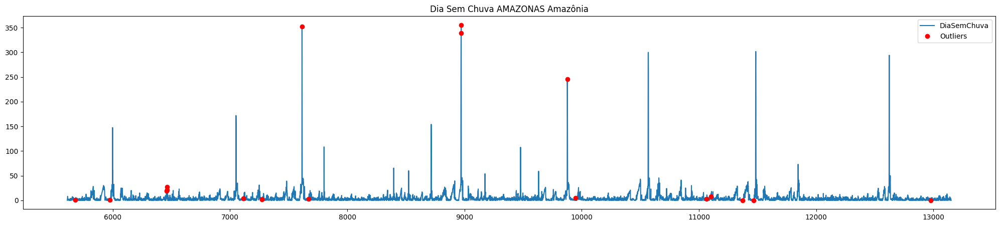

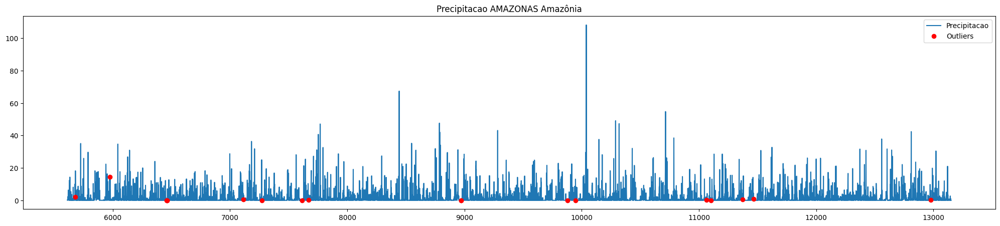

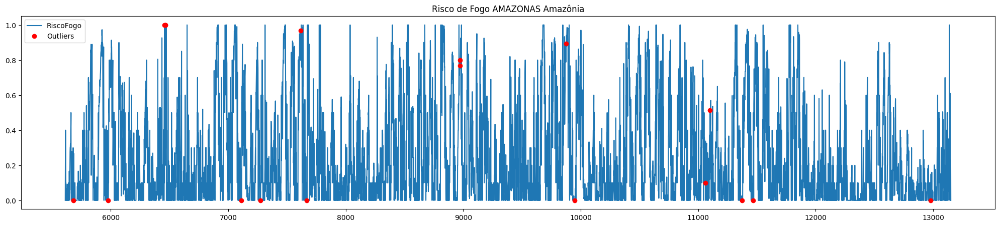

In [8]:
n_plots = 3
for i, nivel in enumerate(df['UF_BIOMA'].unique().tolist()):
    
    plots.anomalias(df, nivel)
    if i > n_plots: break

#### 1.5.4 - REMOVENDO OUTLIERS DA BASE

In [9]:
# BASE COM OUTLIERS
df_com_outliers = df.copy()

# BASE SEM OUTLIERS
df = df[df['outliers'] != 1].copy()

# BASE PREDICT DAILY - FORECAST
daily_predict = df.groupby(['Data','Estado','Bioma'], as_index=False).agg({'RiscoFogo':'mean', 'Precipitacao':'mean', 'DiaSemChuva':'mean'})
daily_predict['UF_BIOMA'] = daily_predict['Estado'] + '_' + daily_predict['Bioma'] 

### 1.6 - GROUP BY
- POR DATA;
- POR DIA DATA, ESTADO;
- POR DIA DATA, BIOMA.

In [10]:
# GROUP BY DAILY
daily = df\
    .groupby('Data', as_index=False)\
    .agg(media_dias_sem_chuva=('DiaSemChuva','mean')
        ,media_precipitacao=('Precipitacao', 'mean')
        ,media_risco_fogo=('RiscoFogo', 'mean'))


# GROUP BY DAILY POR ESTADO
daily_uf = df\
    .groupby(['Data','Estado'], as_index=False)\
    .agg(media_dias_sem_chuva=('DiaSemChuva','mean')
        ,media_precipitacao=('Precipitacao', 'mean')
        ,media_risco_fogo=('RiscoFogo', 'mean'))


# GROUP BY DAILY POR BIOMA
daily_bioma = df\
    .groupby(['Data','Bioma'], as_index=False)\
    .agg(media_dias_sem_chuva=('DiaSemChuva','mean')
        ,media_precipitacao=('Precipitacao', 'mean')
        ,media_risco_fogo=('RiscoFogo', 'mean'))


# MÉDIA MOVEL - DAILY
daily['media_movel_dias_sem_chuva'] = daily['media_dias_sem_chuva'].rolling(window=90).mean()
daily['media_movel_precipitacao']   = daily['media_precipitacao'].rolling(window=90).mean()
daily['media_movel_risco_fogo']     = daily['media_risco_fogo'].rolling(window=90).mean()

## 2 - PLOTS

### 2.1 - DAILY: MÉDIAS MOVEIS: JANELA DE 90 DIAS

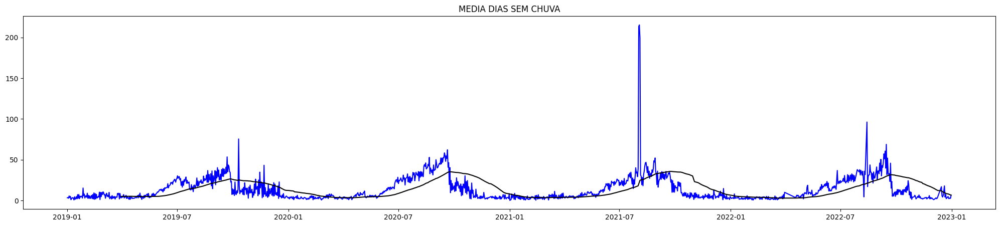

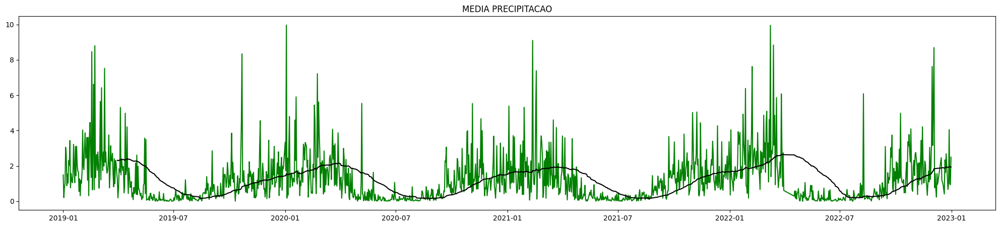

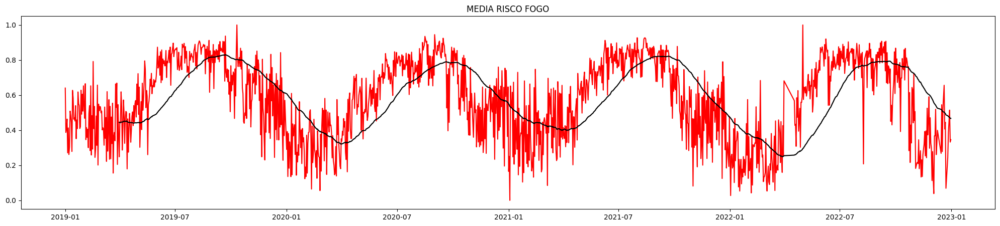

In [11]:
# MÉDIA MOVEL
daily['media_movel_dias_sem_chuva'] = daily['media_dias_sem_chuva'].rolling(window=90).mean()
daily['media_movel_precipitacao']   = daily['media_precipitacao'].rolling(window=90).mean()
daily['media_movel_risco_fogo']     = daily['media_risco_fogo'].rolling(window=90).mean()

# PLOTS
plots.daily_plot(daily, 'media_dias_sem_chuva', 'blue')
plots.daily_plot(daily, 'media_precipitacao', 'green')
plots.daily_plot(daily, 'media_risco_fogo', 'red')

### 2.2 - CORRELAÇÃO: SPEARMAN

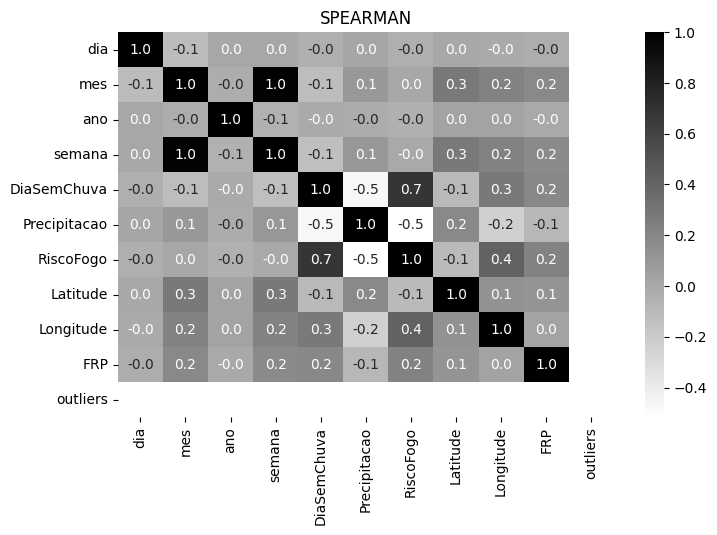

In [12]:
# CORR
plots.correlacao(df, 'spearman')

### 2.3 - MAPA

In [13]:
plots.maps(df, 'RiscoFogo')
plots.maps(df, 'DiaSemChuva')

### 2.4 - DECOMPOSIÇÃO

#### 2.4.1 - DAILY

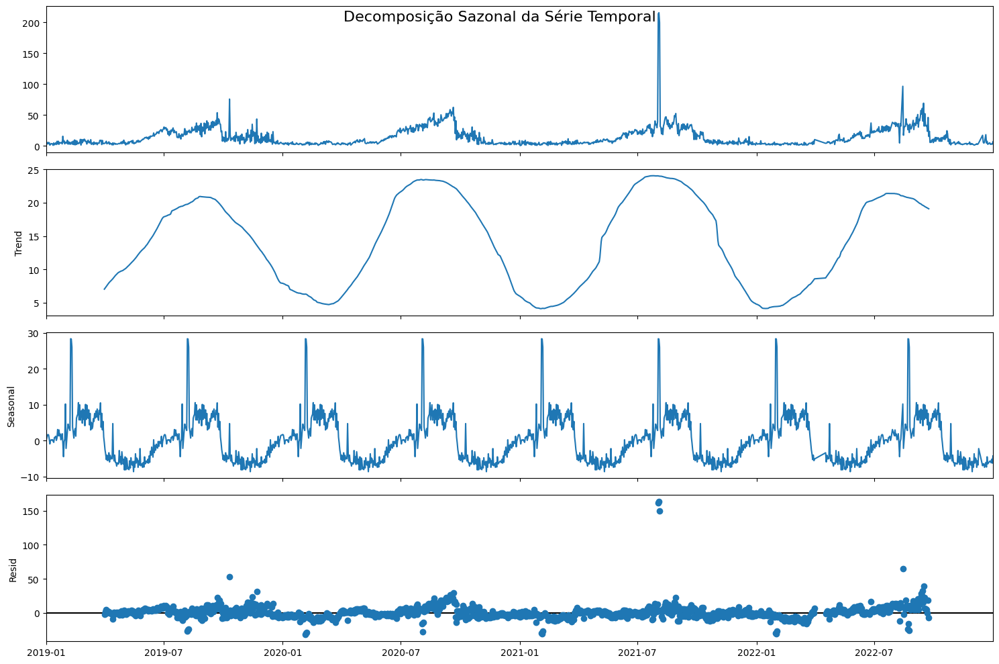

In [14]:
plots.decomposicao(daily, 'media_dias_sem_chuva', model='aditive', period=180)

#### 2.4.2 - DAILY ESTADO
- PERIOD: SE TIVER MENOS DE 180 DIAS DE DADOS NO ESTADO, UTILIZAR TAMANHO/10 COMO PERIODO SAZONAL. SE NÃO, UTILIZAR 180 DIAS COMO SAZONALIDADE 

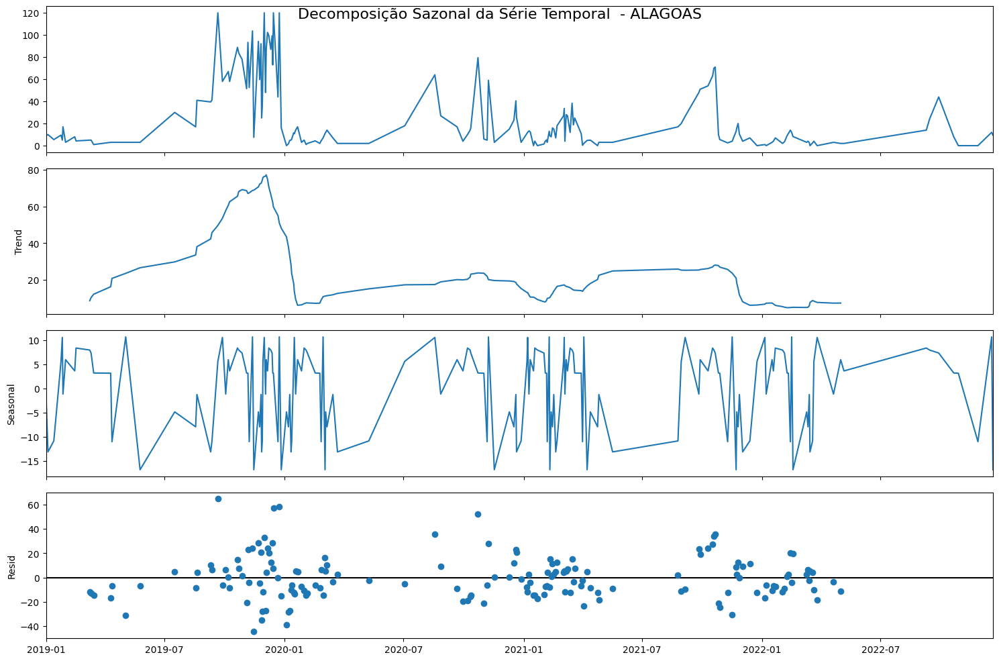

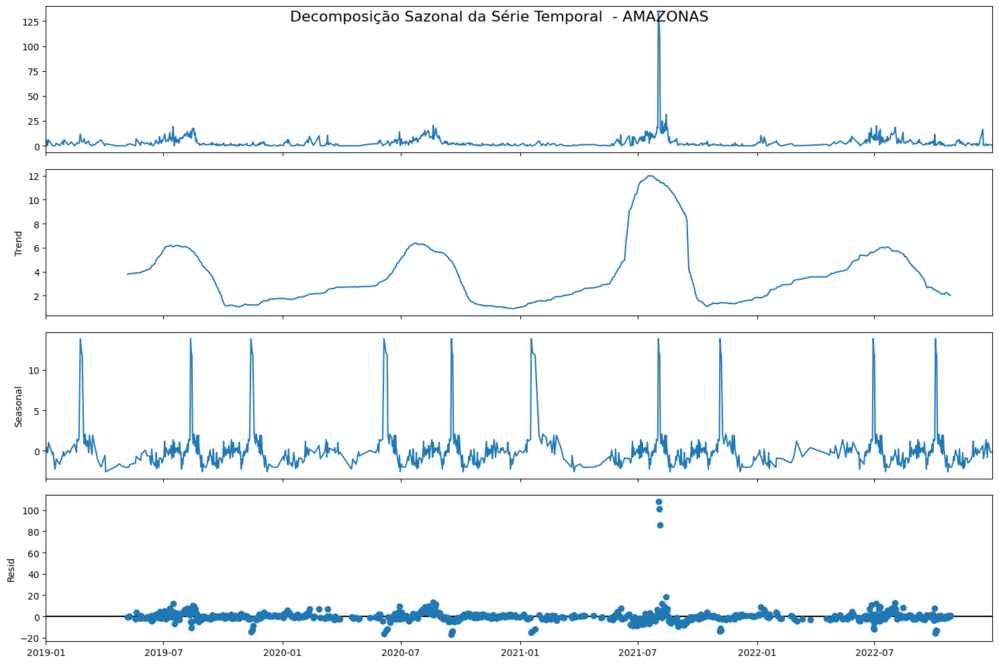

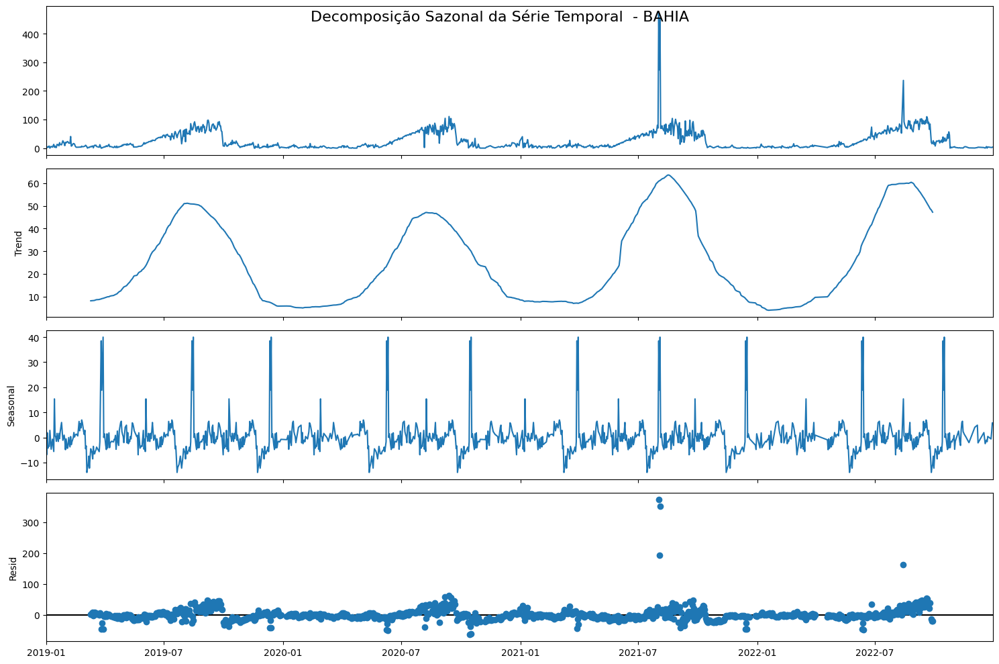

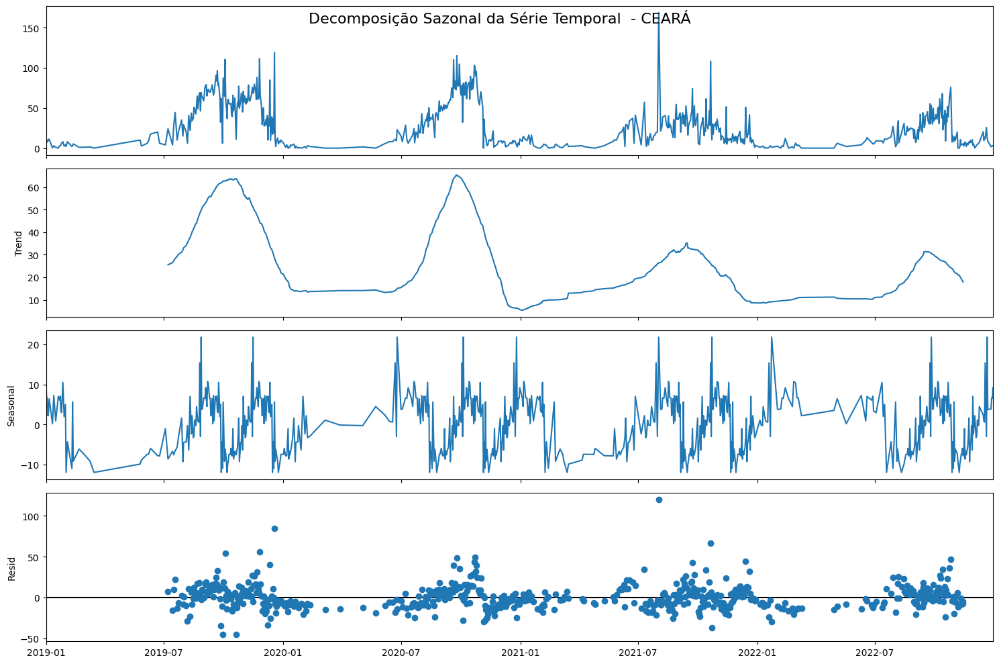

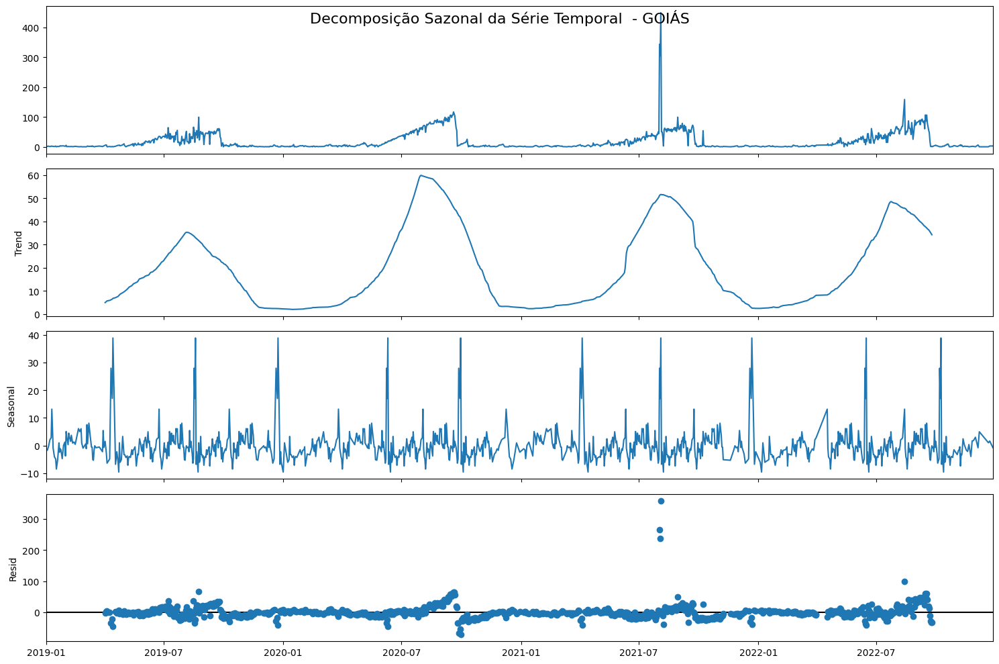

...

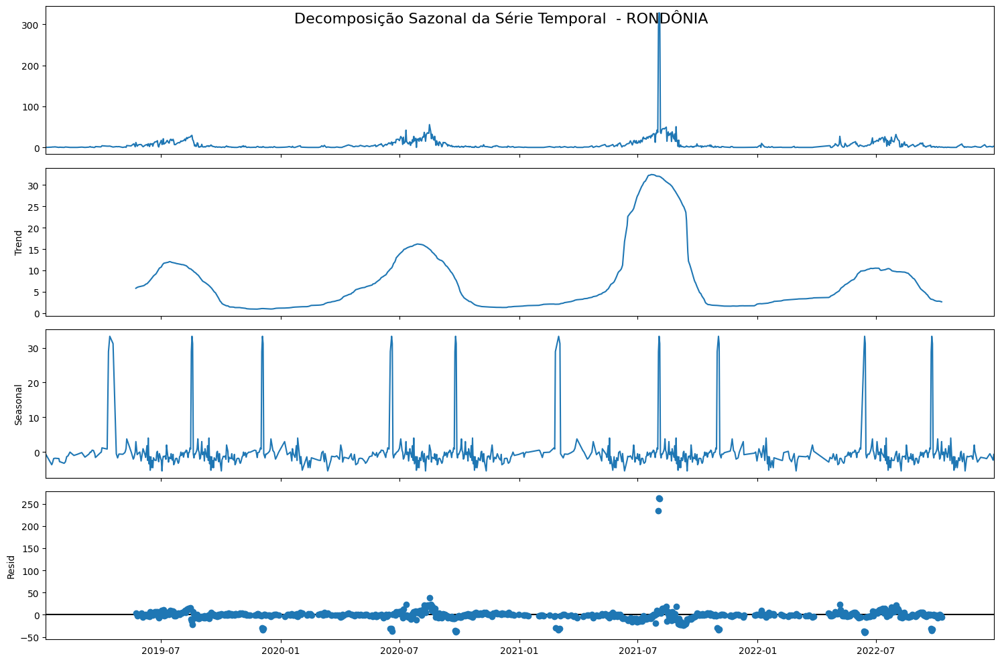

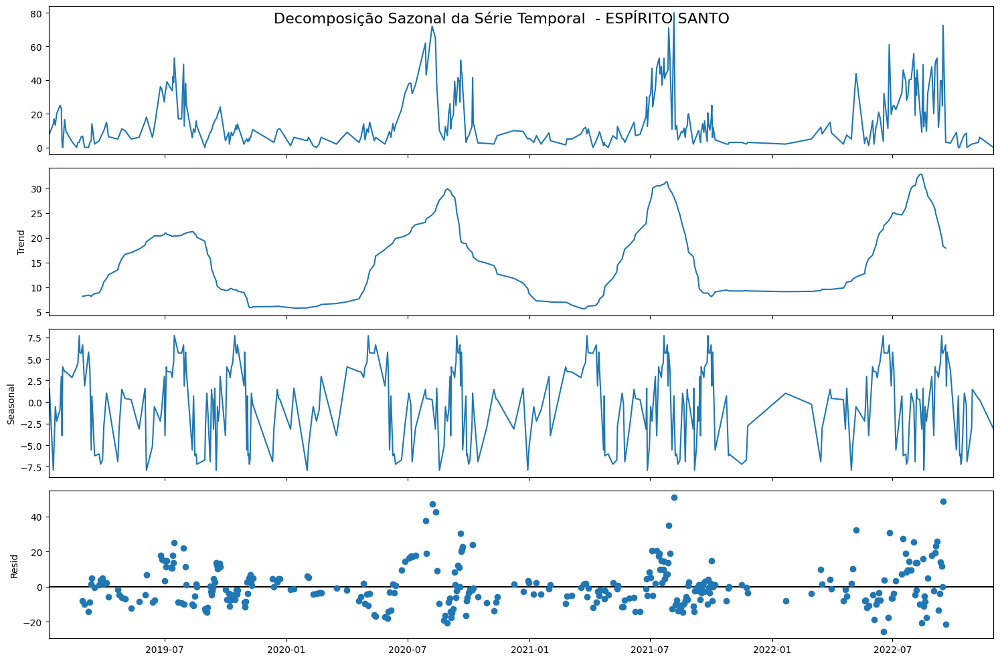

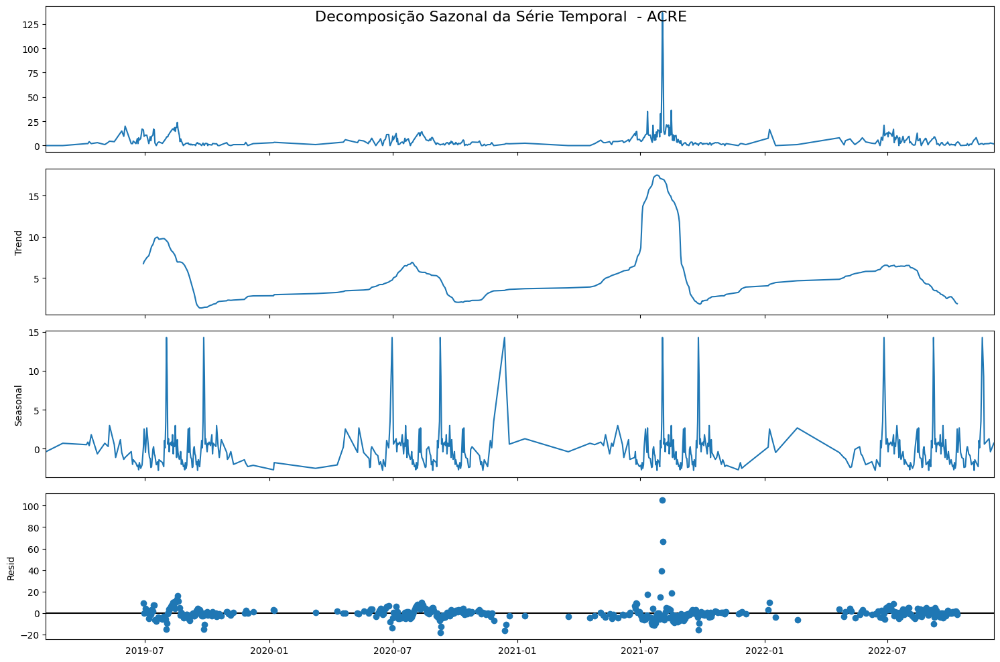

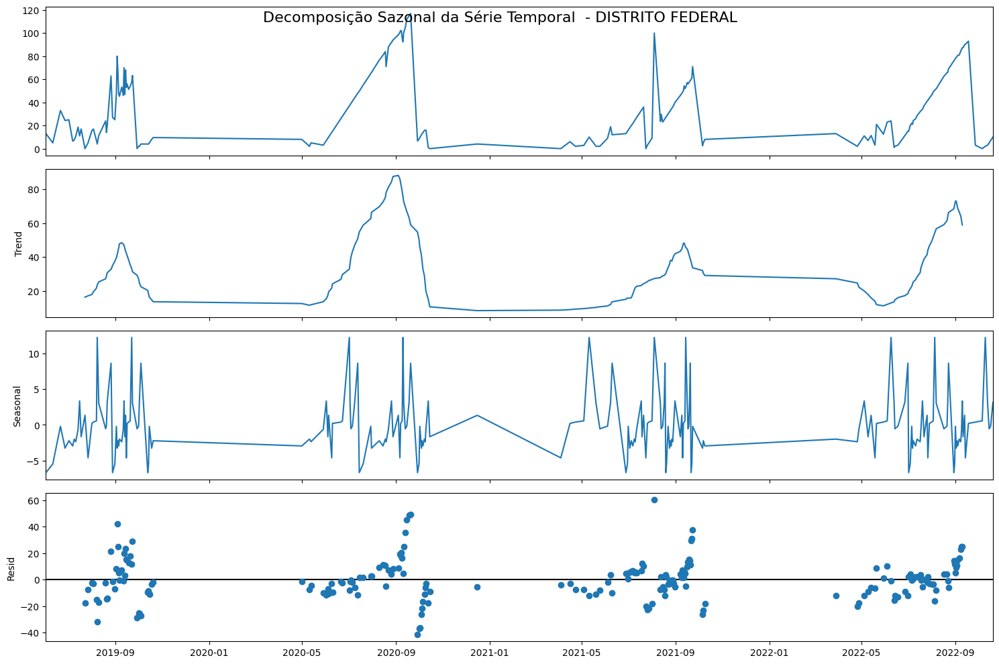

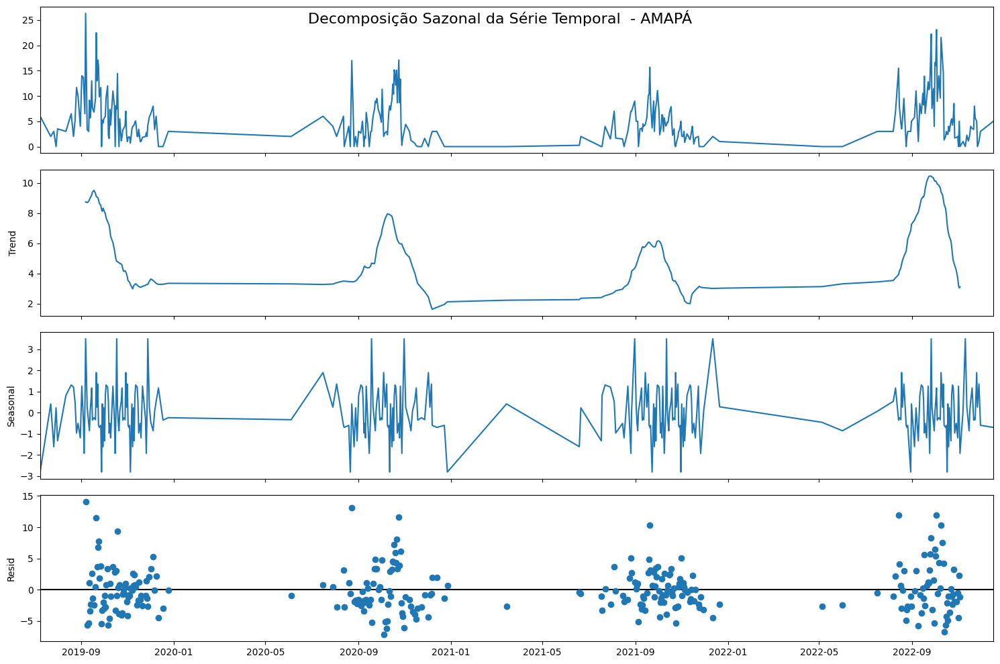

In [15]:
for uf in daily_uf['Estado'].unique().tolist():

    df_temp = daily_uf[daily_uf['Estado'] == uf]
    plots.decomposicao(df=df_temp, col='media_dias_sem_chuva', period=np.min([180, int(np.round(len(df_temp)/10))]), model='aditive', title=f' - {uf}')


#### 2.4.3 - DAILY BIOMA
- PERIOD: SE TIVER MENOS DE 180 DIAS FOR MENOR QUE UM DECIMO DA BASE, UTILIZAR LEN/10 COMO PERIODO SAZONAL. SE NÃO, UTILIZAR 180 DIAS COMO SAZONALIDADE.

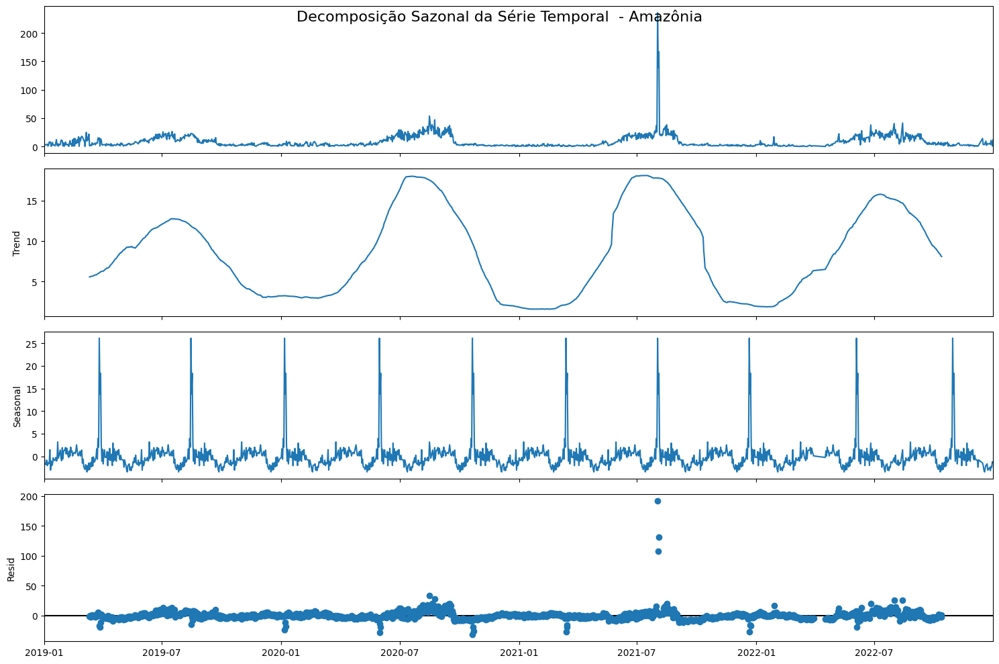

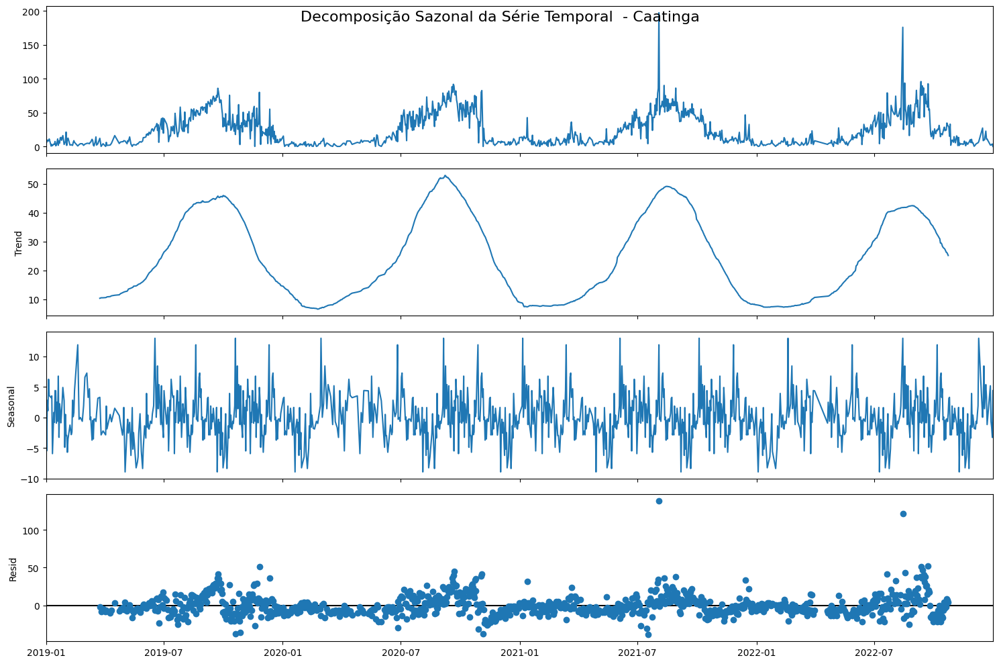

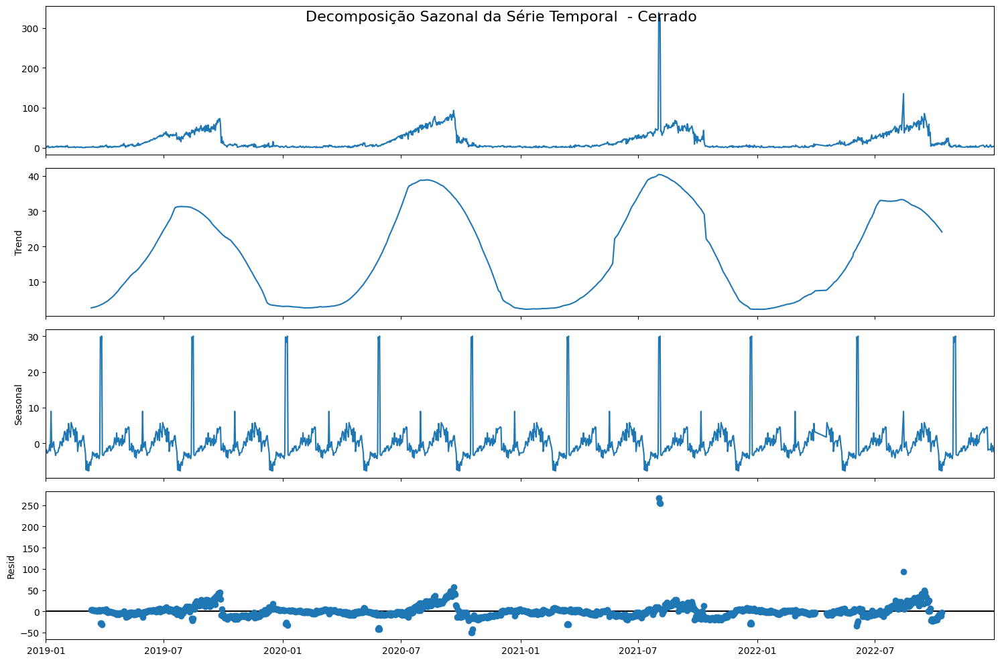

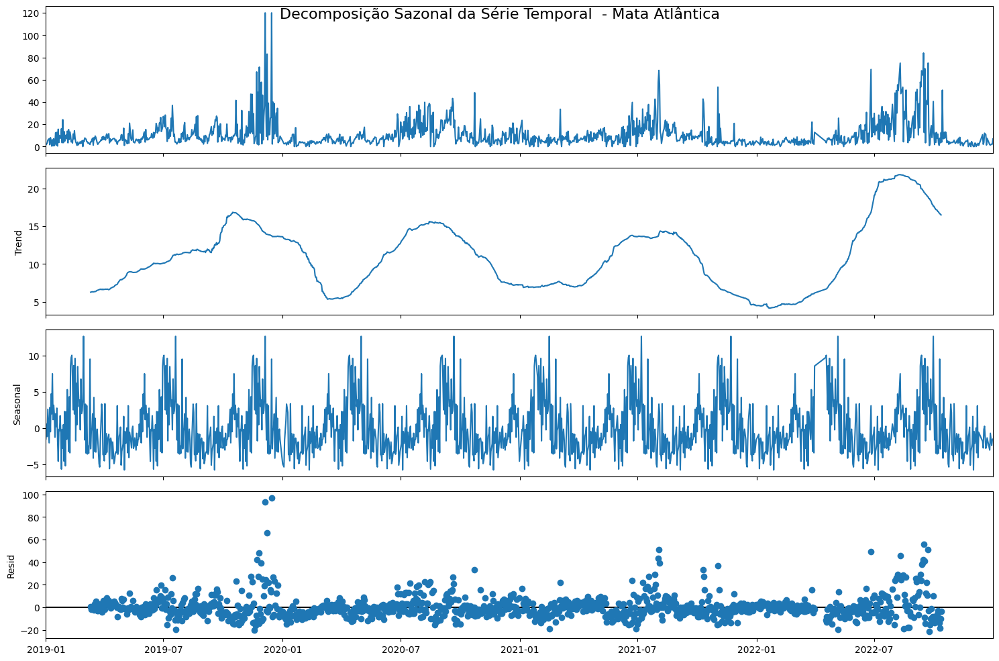

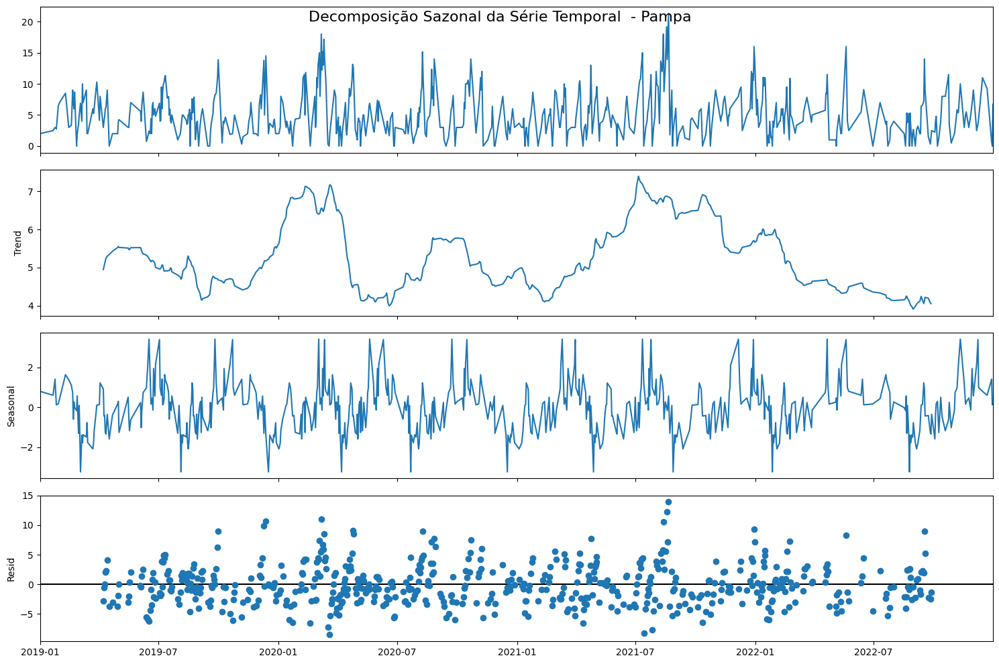

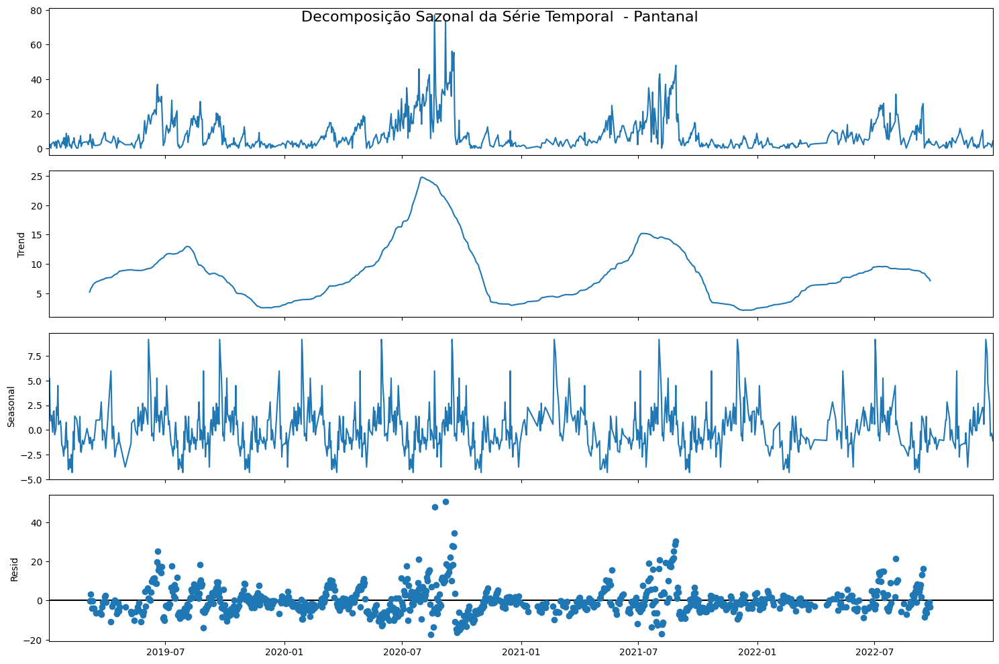

In [16]:
for bioma in daily_bioma['Bioma'].unique().tolist():

    df_temp = daily_bioma[daily_bioma['Bioma'] == bioma]
    plots.decomposicao(df=df_temp, col='media_dias_sem_chuva', period=np.min([180, int(np.round(len(df_temp)/10))]), model='aditive', title=f' - {bioma}')


### 2.5 - PERIODO

#### 2.5.1 - DIA

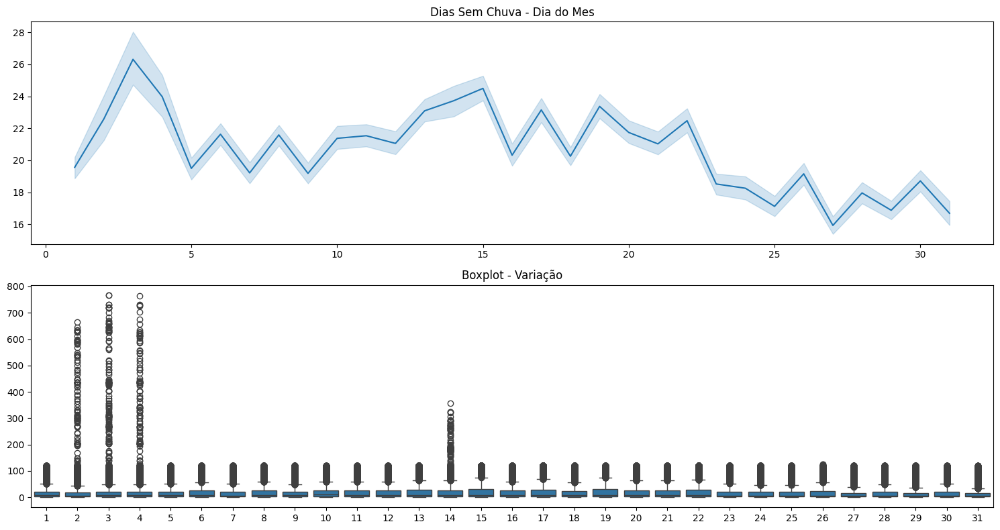

In [17]:
plots.periodo(df=df, x='dia', y='DiaSemChuva', ax_title=['Dias Sem Chuva - Dia do Mes', 'Boxplot - Variação'])

#### 2.5.2 - SEMANA

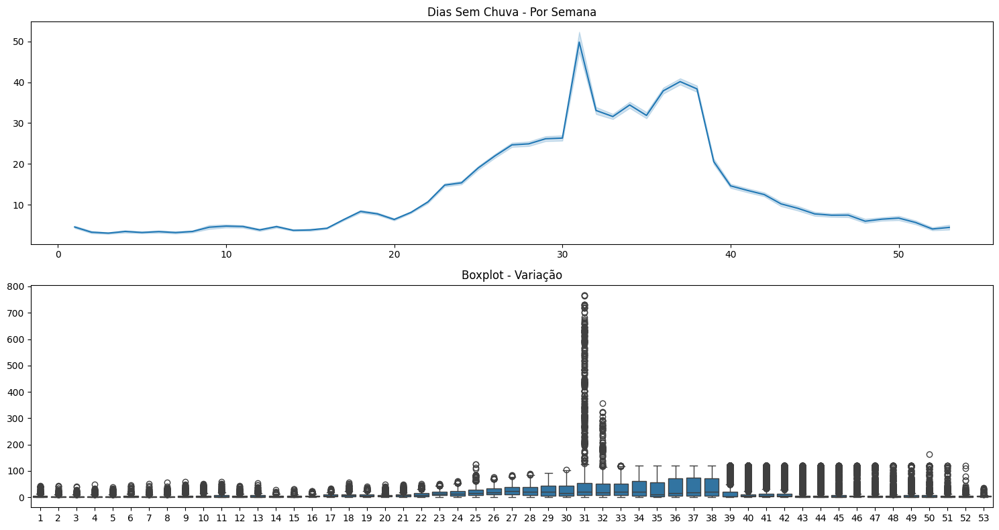

In [18]:
plots.periodo(df=df, x='semana', y='DiaSemChuva', ax_title=['Dias Sem Chuva - Por Semana', 'Boxplot - Variação'])

#### 2.5.3 - MÊS

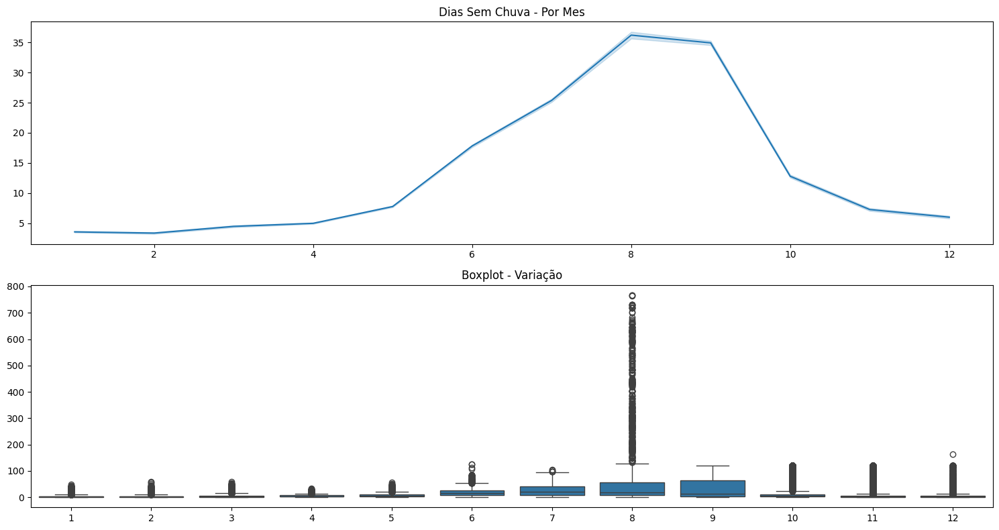

In [19]:
plots.periodo(df=df, x='mes', y='DiaSemChuva', ax_title=['Dias Sem Chuva - Por Mes', 'Boxplot - Variação'])

#### 2.5.4 - YEAR

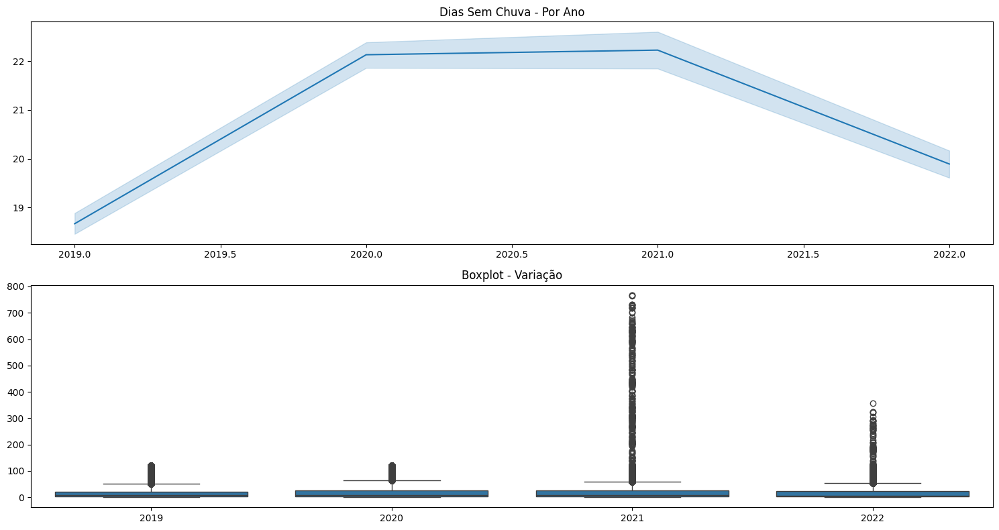

In [20]:
plots.periodo(df=df, x='ano', y='DiaSemChuva', ax_title=['Dias Sem Chuva - Por Ano', 'Boxplot - Variação'])

### 2.6 - AUTO CORRELAÇÃO: RISCO DE FOGO

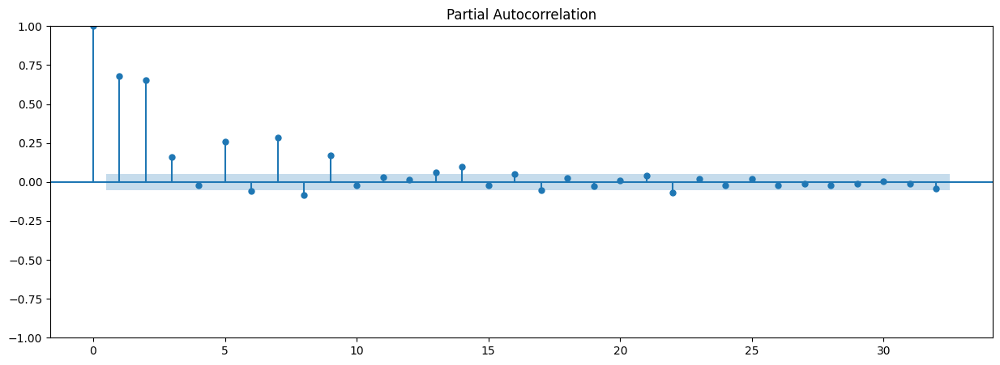

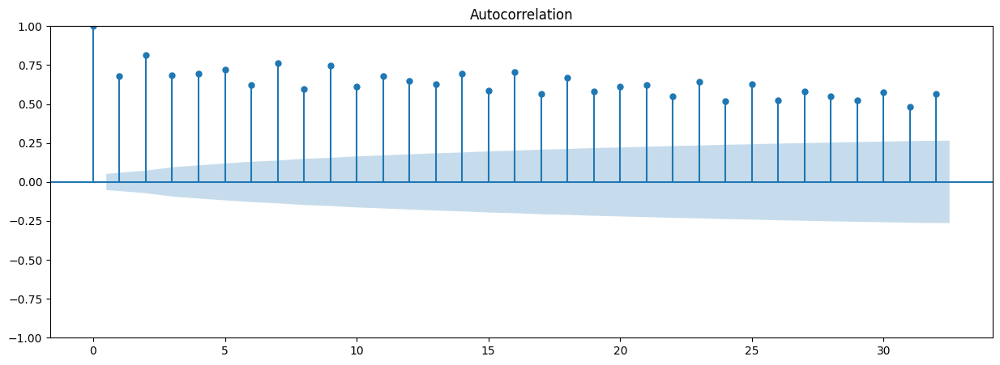

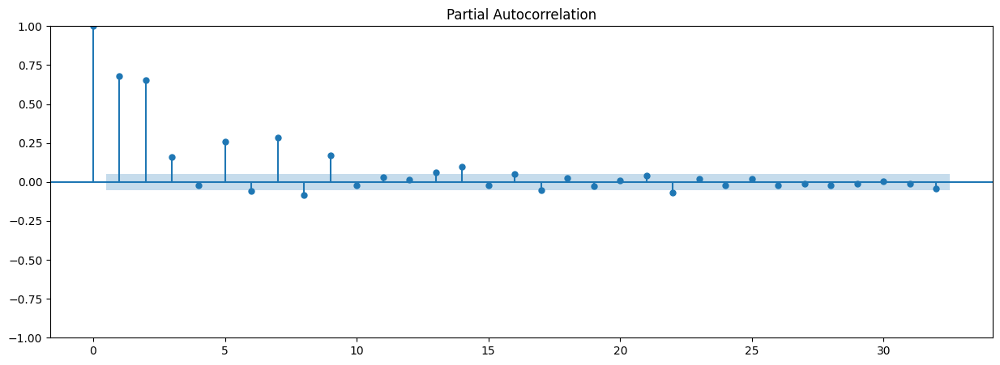

In [21]:
rcParams['figure.figsize'] = 15,5

# SET INDEX DATE
autocorrelacao = daily[['media_dias_sem_chuva','media_precipitacao','media_risco_fogo']]
autocorrelacao.set_index(daily['Data'], inplace=True)

plot_acf(autocorrelacao['media_risco_fogo'])
plot_pacf(autocorrelacao['media_risco_fogo'])

## 3 - PREDICT

### 3.1 - EMBEDDING

In [22]:
# EMBEDDING ESTADO, MUNICIPIO E BIOMA // INCLUIR DATA COMO INDEX
daily_predict_emb = utils.embedding_data(daily_predict).set_index('Data')

### 3.2 - MODELS

#### 3.2.1 - AUTO-ARIMA W/ SEASONAL **************** ARRUMAR

AIC: -152.85846691754205


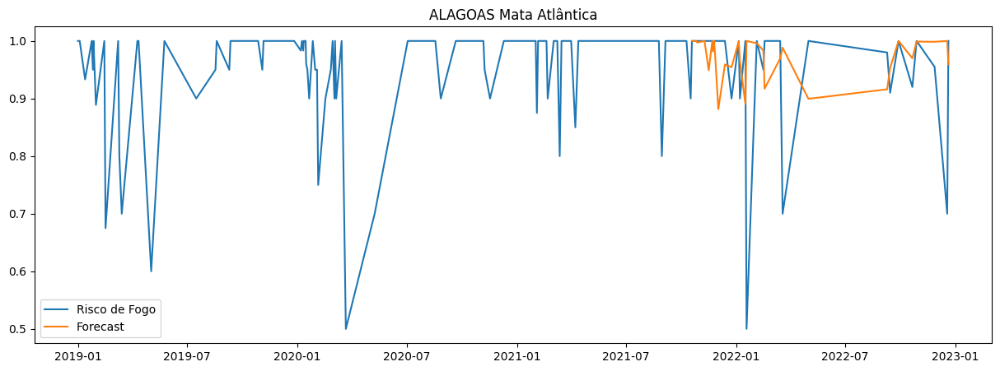

MemoryError: Unable to allocate 444. MiB for an array with shape (286, 286, 711) and data type float64

In [23]:
predicted = pd.DataFrame(columns=['Data','UF_BIOMA','forecast'])

for filtro in daily_predict_emb['UF_BIOMA'].unique().tolist():

    # TRAIN TEST SPLIT DATA PARA MODELO
    x_train, y_train, x_test, y_test, train, test = utils.df_train_test_split(df=daily_predict_emb, filtro=filtro, perc=.8)

    # MODELO
    stepwise_model = utils.predict(x=x_train, y=y_train)

    # PREDICT
    test['forecast'] = stepwise_model.predict(X=x_test, n_periods=len(x_test))
    
    # SE PROBABILIDADE DE FOGO MENOR QUE ZERO ENTÃO 0
    test['forecast'] = np.max([test['forecast'], np.zeros(len(test))], axis=0)
    
    # SE PROBABILIDADE DE FOGO MAIOR QUE 1 ENTÃO 1
    test['forecast'] = np.min([test['forecast'], np.full(len(test), 1)], axis=0)

    # UNIR BASES
    data = pd.concat([train, test], axis=0)

    # PLOT
    plots.predicted(data, filtro.replace('_', ' '))

    # CONCAT BASE FINAL
    predicted = pd.concat([predicted, data[data['forecast'].notna()][['Data','UF_BIOMA','forecast']]], axis=0)

#### 3.2.2 - DEEP LEARNING: TIME SERIES W/ TRANSFORMERS ********* CRIAR CODIGO